In [4]:
def print_parameters_srg(G):
    adjacent = False
    not_adjacent = False
    num_of_vertices = len(G.vertices())
    k = G.average_degree()
    l = 0
    m = 0
    for v in G.vertices():
        for u in G.vertices():
            if v != u and G.has_edge(v, u):
                l = len(list(set(G.neighbors(v)).intersection(G.neighbors(u))))
                adjacent = True
            elif v != u and not G.has_edge(v, u):
                m = len(list(set(G.neighbors(v)).intersection(G.neighbors(u))))
                not_adjacent = True
            if adjacent and not_adjacent:
                print(num_of_vertices, k, l, m)
                return num_of_vertices, k, l, m

def print_parameters(G):
    adjacent = False
    not_adjacent = False
    num_of_vertices = len(G.vertices())
    k = G.average_degree()
    l = 0
    l_total = 0
    m = 0
    m_total = 0
    for v in G.vertices():
        for u in G.vertices():
            if v != u and G.has_edge(v, u):
                l += len(list(set(G.neighbors(v)).intersection(G.neighbors(u))))
                l_total += 1
            elif v != u:
                m += len(list(set(G.neighbors(v)).intersection(G.neighbors(u))))
                m_total += 1
    print(num_of_vertices, k, l / l_total, m / m_total)
    return num_of_vertices, k, l / l_total, m / m_total

def is_strongly_regular_v2(G, v, k, l, m):
    return G.is_strongly_regular() and (v - k - 1) * m == k * (k - l - 1)

def tri_construct(G):
    done_cycles = []
    H = graphs.EmptyGraph()
    cycles = filter(lambda x: len(x)==4 and x[1]<x[-2], list(G.to_directed().all_cycles_iterator(simple=true, max_length=3)))
    vertex = 0
    for cycle in cycles:
        H.add_vertex(vertex)
        for done_cycle in done_cycles:
            adjacents = list(set(cycle).intersection(done_cycle))
            if len(adjacents) > 0:
                H.add_edge(vertex, done_cycles.index(done_cycle))
        done_cycles.append(cycle)
        vertex += 1
    return H

def e_val(G):
    A = G
    if isinstance(A, Graph):
        A = G.adjacency_matrix()
    e = A.eigenvalues()
    d = dict((i, e.count(i)) for i in e)
    return d   

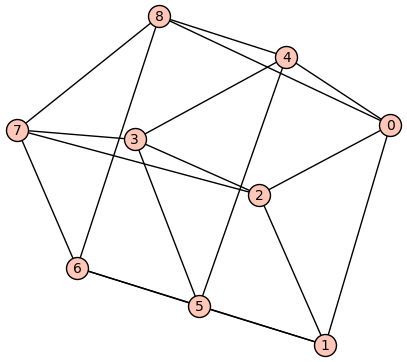

9 4 1 2
Is Strongly Regular? True


In [2]:
# Paley 9
Paley_9 = Graph(graphs.PaleyGraph(9).adjacency_matrix())
Paley_9.show(figsize=5, vertex_size=250)
v, k, l, m = print_parameters(Paley_9)
print("Is Strongly Regular?", is_strongly_regular_v2(Paley_9, v, k , l, m))

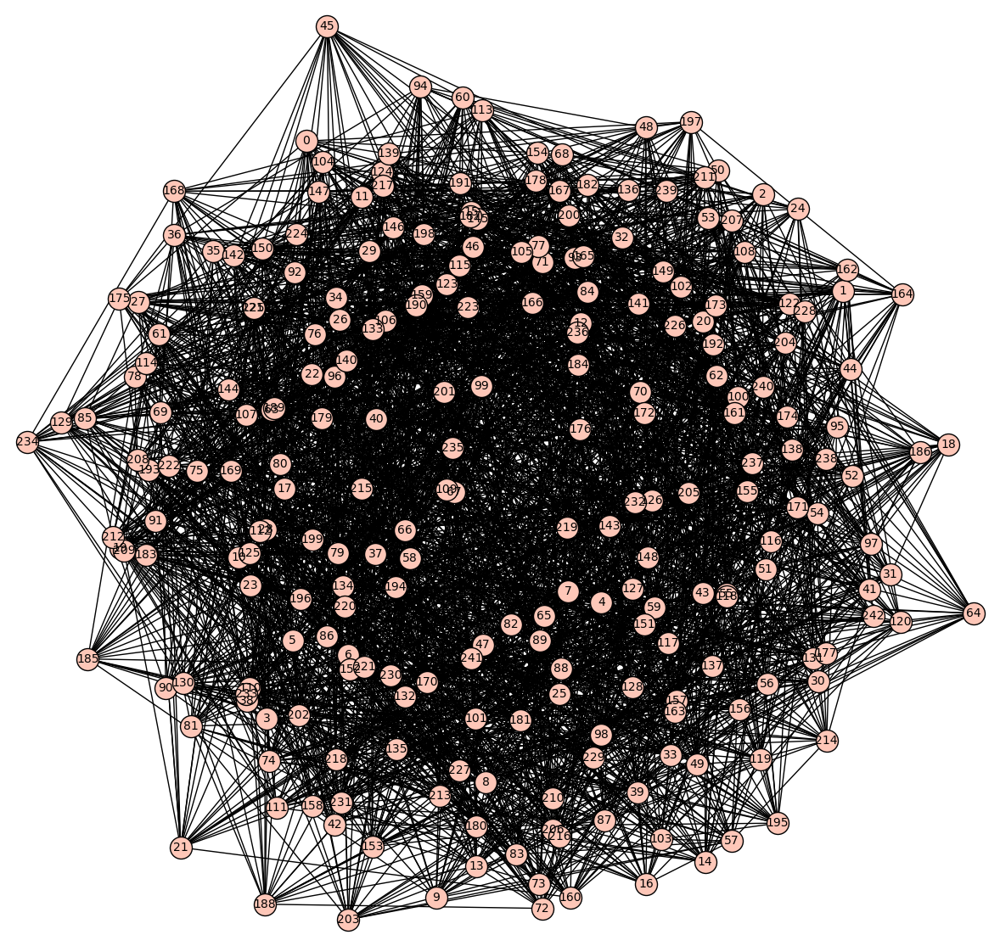

243 22 1 2
Is Strongly Regular? True


In [4]:
G243 = graphs.strongly_regular_graph(243,22,1,2)
G243.show(figsize=15, vertex_size=350)
v, k, l, m = print_parameters(G243)
print("Is Strongly Regular?", is_strongly_regular_v2(G243, v, k , l, m))

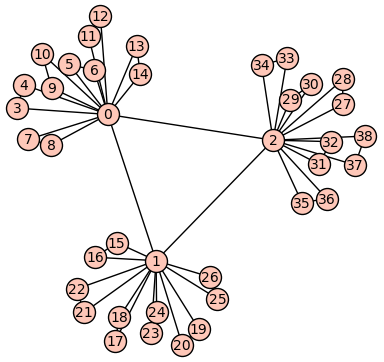

In [5]:
g = graphs.EmptyGraph()
g.add_edge(0,1)
g.add_edge(0,2)
g.add_edge(1,2)

for i in range(3, 15):
    g.add_edge(0,i)
g.add_edge(3,4)
g.add_edge(5,6)
g.add_edge(7,8)
g.add_edge(9,10)
g.add_edge(11,12)
g.add_edge(13,14)

for i in range(15, 27):
    g.add_edge(1,i)
g.add_edge(15,16)
g.add_edge(17,18)
g.add_edge(19,20)
g.add_edge(21,22)
g.add_edge(23,24)
g.add_edge(25,26)

for i in range(27, 39):
    g.add_edge(2,i)
g.add_edge(27,28)
g.add_edge(29,30)
g.add_edge(31,32)
g.add_edge(33,34)
g.add_edge(35,36)
g.add_edge(37,38)
g.show(figsize=5, vertex_size=250)

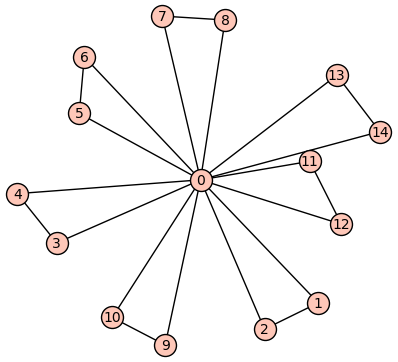

In [6]:
g = graphs.EmptyGraph()
for i in range(14):
    g.add_vertex()
for i in range(1, 15):
    g.add_edge(0,i)
    if i % 2 == 1:
        g.add_edge(i,i+1)
g.show(figsize=5, vertex_size=250)

In [7]:
def steiner():
    system = []
    file1 = open('steiner_systems/steiner(3,6,22).txt', 'r')
    Lines = file1.readlines()
     
    for line in Lines:
        block = []
        words = line.strip().split()
        for word in words:
            block.append(eval(word))
        system.append(block)
    return system
S = steiner()

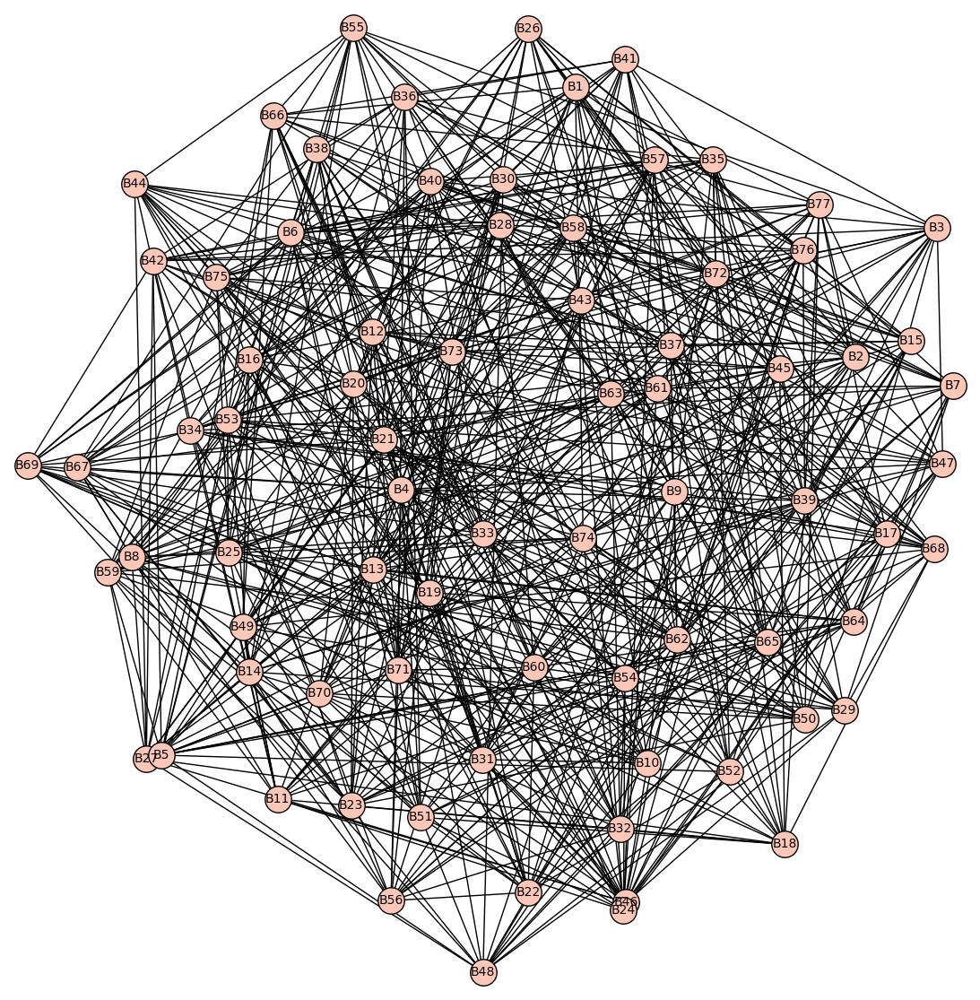

77 16 0 4
Is Strongly Regular? True


In [8]:
# Mesner
# Block Graph of S(3,6,22)
Mesner = graphs.EmptyGraph()
for i in range(len(S)):
    Mesner.add_vertex("B" + str(i+1))
for i, block_a in enumerate(S):
        for j, block_b in enumerate(S):
            if block_a != block_b and len(list(set(block_a).intersection(block_b))) == 0:
                Mesner.add_edge("B" + str(i + 1), "B" + str(j + 1))
Mesner.show(figsize=15, vertex_size=450)
v, k, l, m = print_parameters(Mesner)
print("Is Strongly Regular?", is_strongly_regular_v2(Mesner, v, k , l, m))

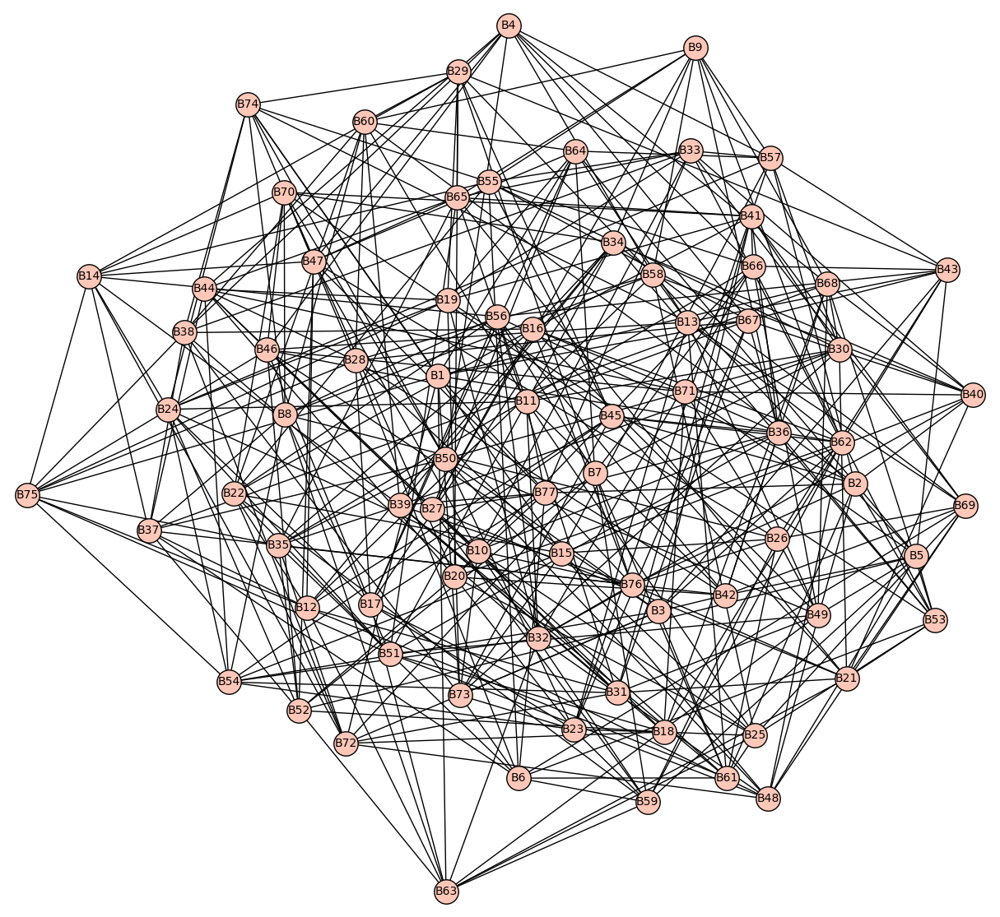

Is Strongly Regular? False


In [9]:
HG = copy(Mesner)
for _ in range(3):
    HG.delete_edges(HG.hamiltonian_cycle().edges())
HG.show(figsize=15, vertex_size=450)
print("Is Strongly Regular?", HG.is_strongly_regular())

In [10]:
C2 = Combinations(range(1, 23), 2).list()

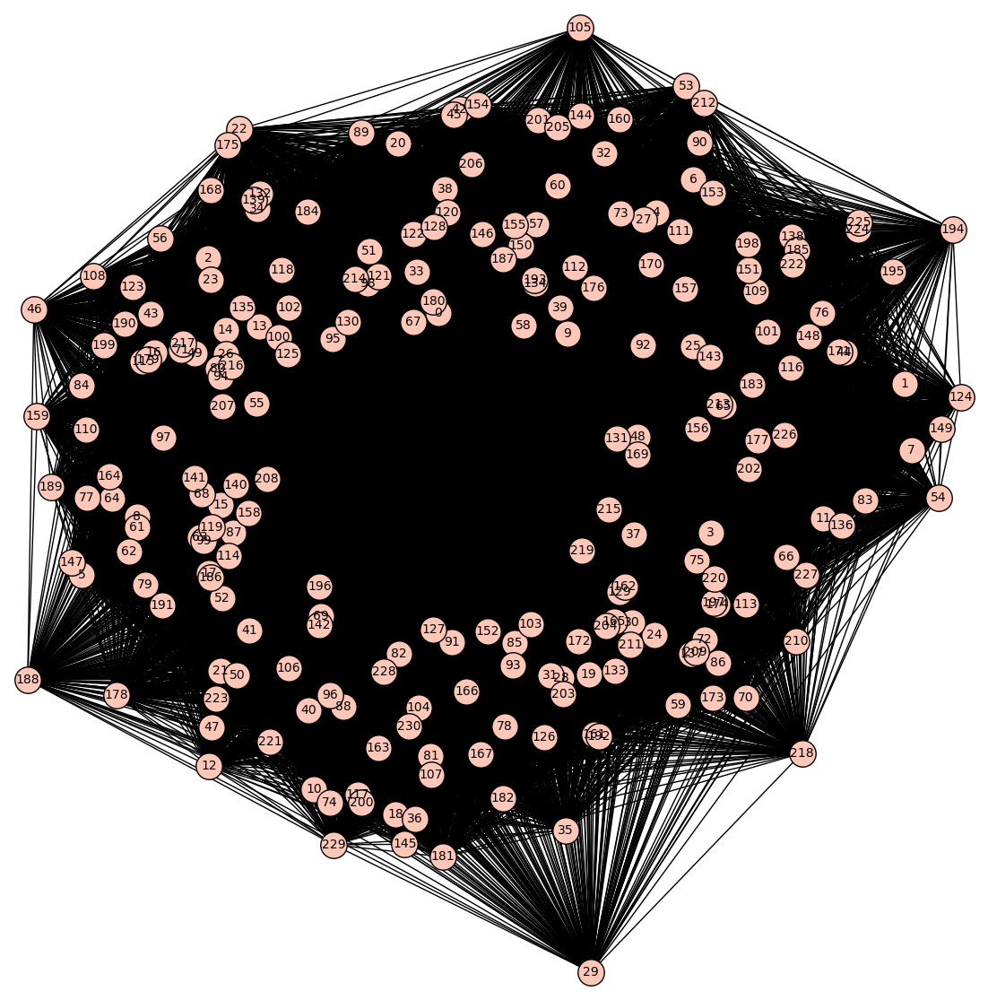

231 190 153 171
Is Strongly Regular? True


In [12]:
# Kneser
Kneser = graphs.EmptyGraph()
for u in C2:
    for v in C2:
        if u != v and len(list(set(u).intersection(v))) == 0:
            Kneser.add_edge(C2.index(u), C2.index(v))
Kneser.show(figsize=15, vertex_size=450)
v, k, l, m = print_parameters(Kneser)
print("Is Strongly Regular?", is_strongly_regular_v2(Kneser, v, k , l, m))

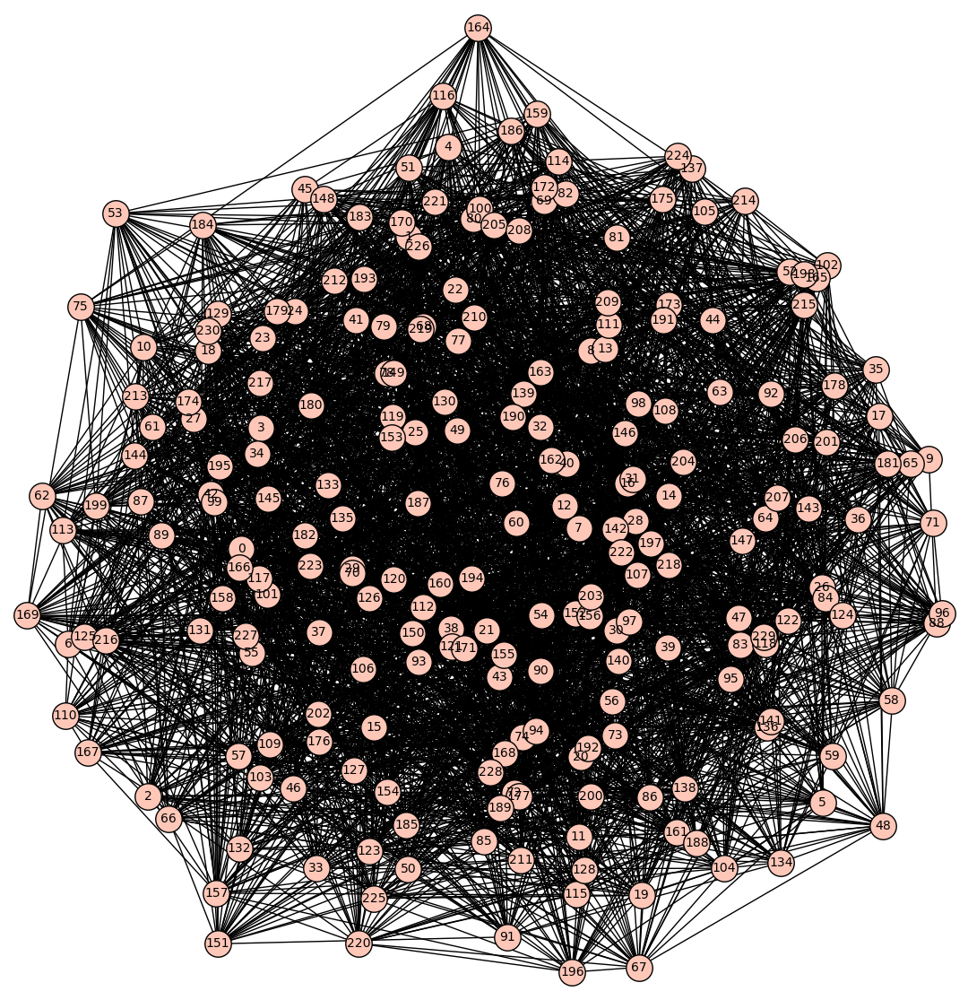

231 30 9 3
Is Strongly Regular? True


In [13]:
# Cameron
Cameron = graphs.EmptyGraph()
for u in C2:
    for v in C2:
        if u != v and len(list(set(u).intersection(v))) == 0:
            for block in S:
                if set(u).issubset(block) and set(v).issubset(block):
                    Cameron.add_edge(C2.index(u), C2.index(v))
                    break
Cameron.show(figsize=15, vertex_size=450)
v, k, l, m = print_parameters(Cameron)
print("Is Strongly Regular?", is_strongly_regular_v2(Cameron, v, k , l, m))

In [14]:
C3 = Combinations(range(1, 23), 3).list()

In [25]:
KG_22_3 = graphs.EmptyGraph()
for u in C3:
    for v in C3:
        if u != v and not KG_22_3.has_edge(C3.index(u), C3.index(v)) and len(list(set(u).intersection(v))) == 0:
            KG_22_3.add_edge(C3.index(u), C3.index(v))
    if C3.index(u) % 100 == 0:
        print("Edges Done:", len(KG_22_3.edges()))
# KG_22_3.show(figsize=15, vertex_size=450)
v, k, l, m = print_parameters(KG_22_3)
print("Is Strongly Regular?", is_strongly_regular_v2(KG_22_3, v, k , l, m))

Edges Done: 969
Edges Done: 97869
Edges Done: 194769
Edges Done: 277746
Edges Done: 359210
Edges Done: 427210
Edges Done: 491610
Edges Done: 547610
Edges Done: 595525
Edges Done: 637294
Edges Done: 672056
Edges Done: 699600
Edges Done: 720225
Edges Done: 734610
Edges Done: 742966
Edges Done: 746020
1540 969 560 680
Is Strongly Regular? False


### Below are known strongly regular graphs where $\lambda=1$ and their triangle graph

Strongly Regular Graph


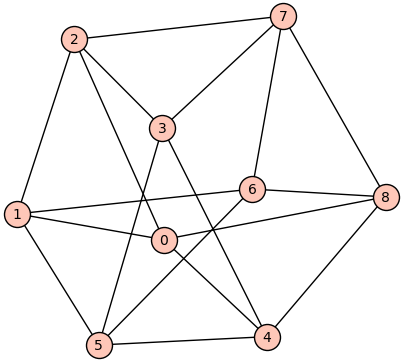

{4: 1, 1: 4, -2: 4}
Computed Triangle Graph


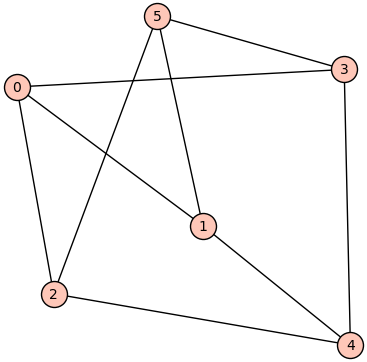

{3: 1, -3: 1, 0: 4}
6 3
True
True
72


In [5]:
G = Graph(graphs.strongly_regular_graph(9,4,1,2).adjacency_matrix())
H = tri_construct(G)
print("Strongly Regular Graph")
G.show(figsize=5, vertex_size=350)
print(e_val(G))
print("Computed Triangle Graph")
H.show(figsize=5, vertex_size=350)
print(e_val(H))
print(len(H.vertices()), H.average_degree())
print(H.is_regular())
print(H.is_strongly_regular())
print(H.automorphism_group().cardinality())

Strongly Regular Graph


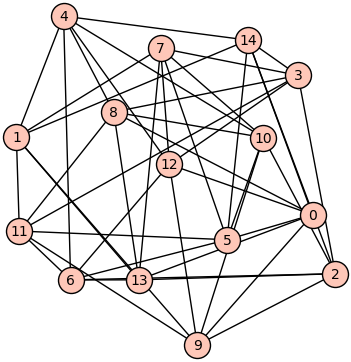

{6: 1, -3: 5, 1: 9}
Computed Triangle Graph


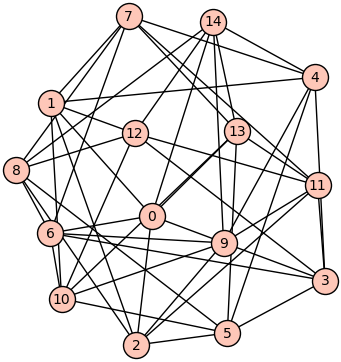

{6: 1, -3: 5, 1: 9}
15 6
True
True
720


In [6]:
G = Graph(graphs.strongly_regular_graph(15,6,1,3).adjacency_matrix())
H = tri_construct(G)
print("Strongly Regular Graph")
G.show(figsize=5, vertex_size=350)
print(e_val(G))
print("Computed Triangle Graph")
H.show(figsize=5, vertex_size=350)
print(e_val(H))
print(len(H.vertices()), H.average_degree())
print(H.is_regular())
print(H.is_strongly_regular())
print(H.automorphism_group().cardinality())

Strongly Regular Graph


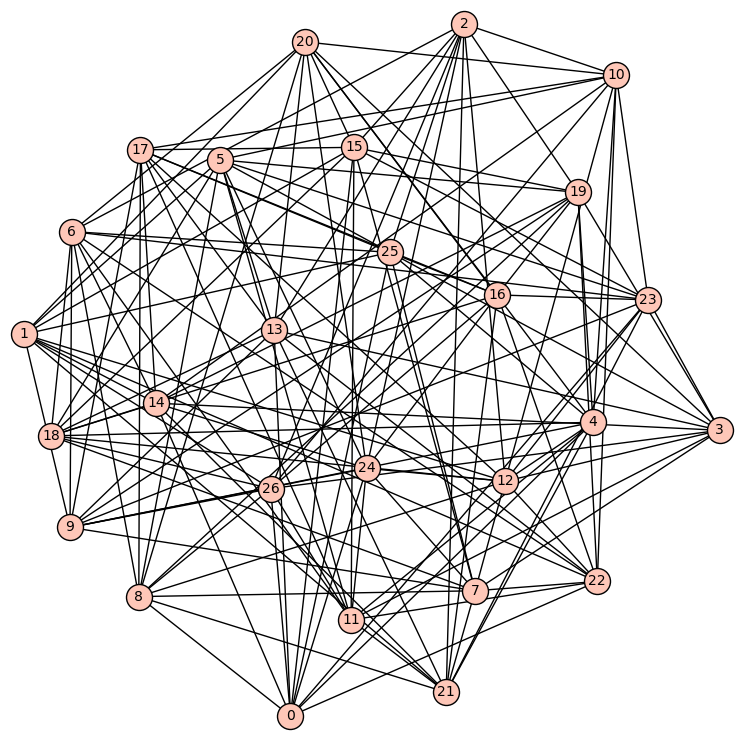

{10: 1, -5: 6, 1: 20}
Computed Triangle Graph


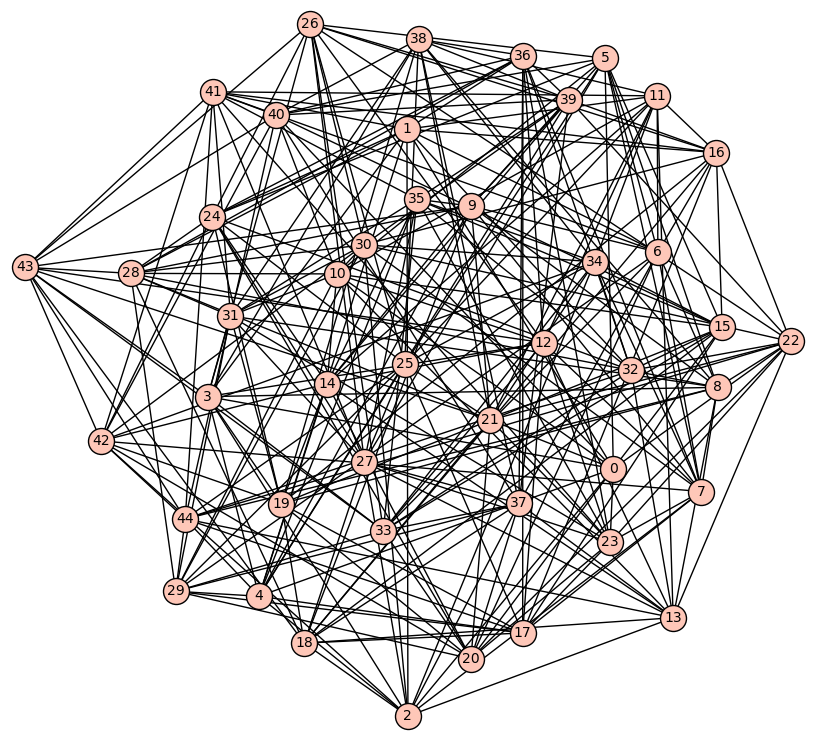

{12: 1, 3: 20, -3: 24}
45 12
True
True
51840


In [7]:
G = Graph(graphs.strongly_regular_graph(27,10,1,5).adjacency_matrix())
H = tri_construct(G)
print("Strongly Regular Graph")
G.show(figsize=10, vertex_size=350)
print(e_val(G))
print("Computed Triangle Graph")
H.show(figsize=10, vertex_size=350)
print(e_val(H))
print(len(H.vertices()), H.average_degree())
print(H.is_regular())
print(H.is_strongly_regular())
print(H.automorphism_group().cardinality())

Strongly Regular Graph


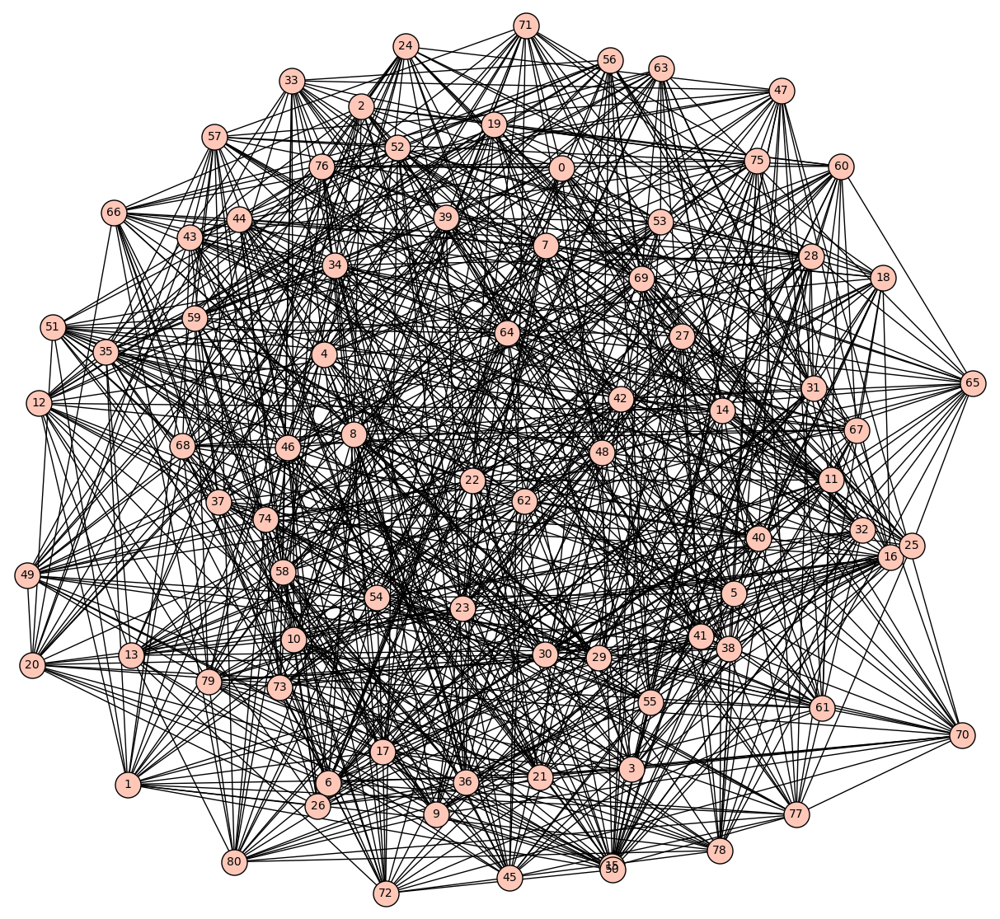

{20: 1, -7: 20, 2: 60}
Computed Triangle Graph


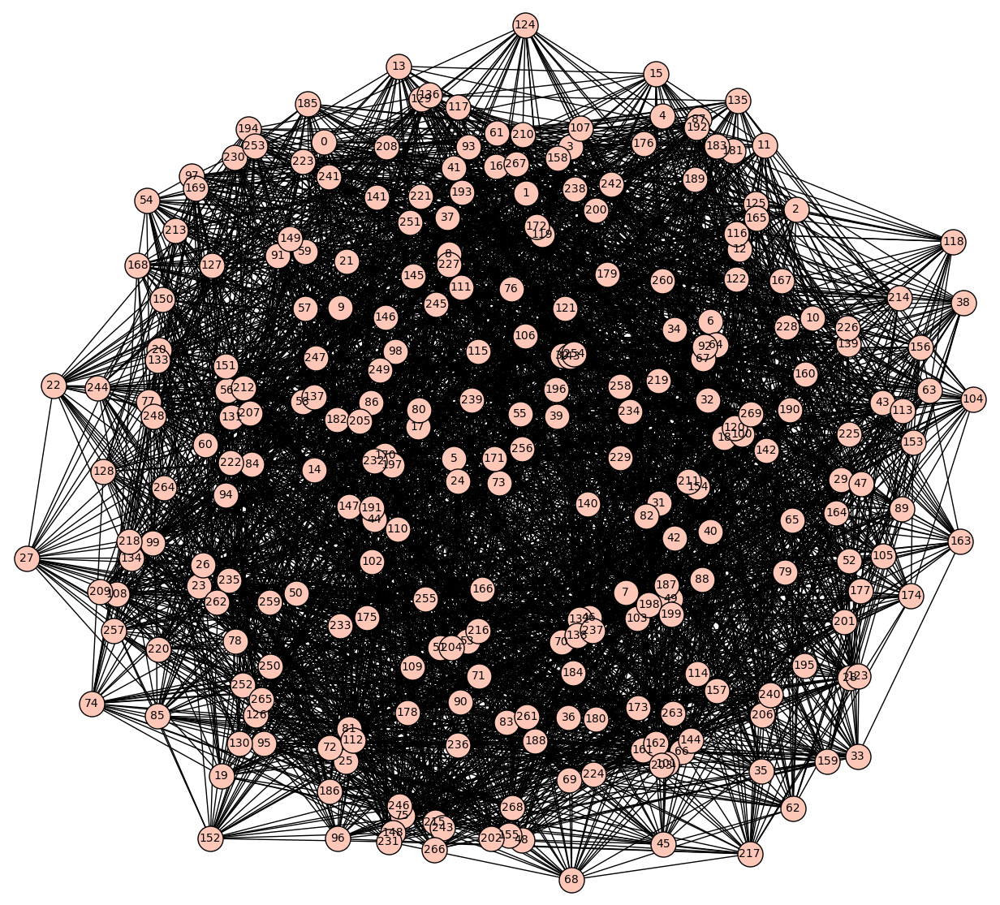

{27: 1, 0: 20, 9: 60, -3: 189}
270 27
True
False
233280


In [8]:
G = Graph(graphs.strongly_regular_graph(81,20,1,6).adjacency_matrix())
H = tri_construct(G)
print("Strongly Regular Graph")
G.show(figsize=15, vertex_size=500)
print(e_val(G))
print("Computed Triangle Graph")
H.show(figsize=15, vertex_size=500)
print(e_val(H))
print(len(H.vertices()), H.average_degree())
print(H.is_regular())
print(H.is_strongly_regular())
print(H.automorphism_group().cardinality())

Strongly Regular Graph


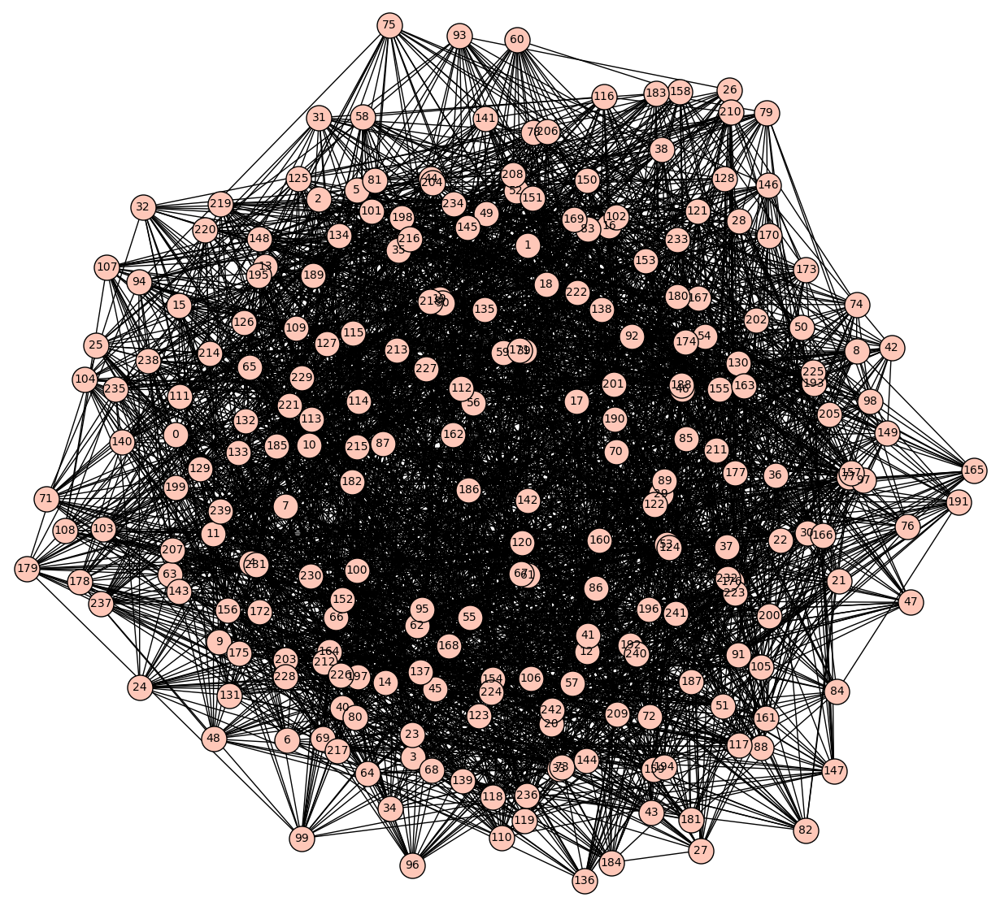

{22: 1, -5: 110, 4: 132}
Computed Triangle Graph


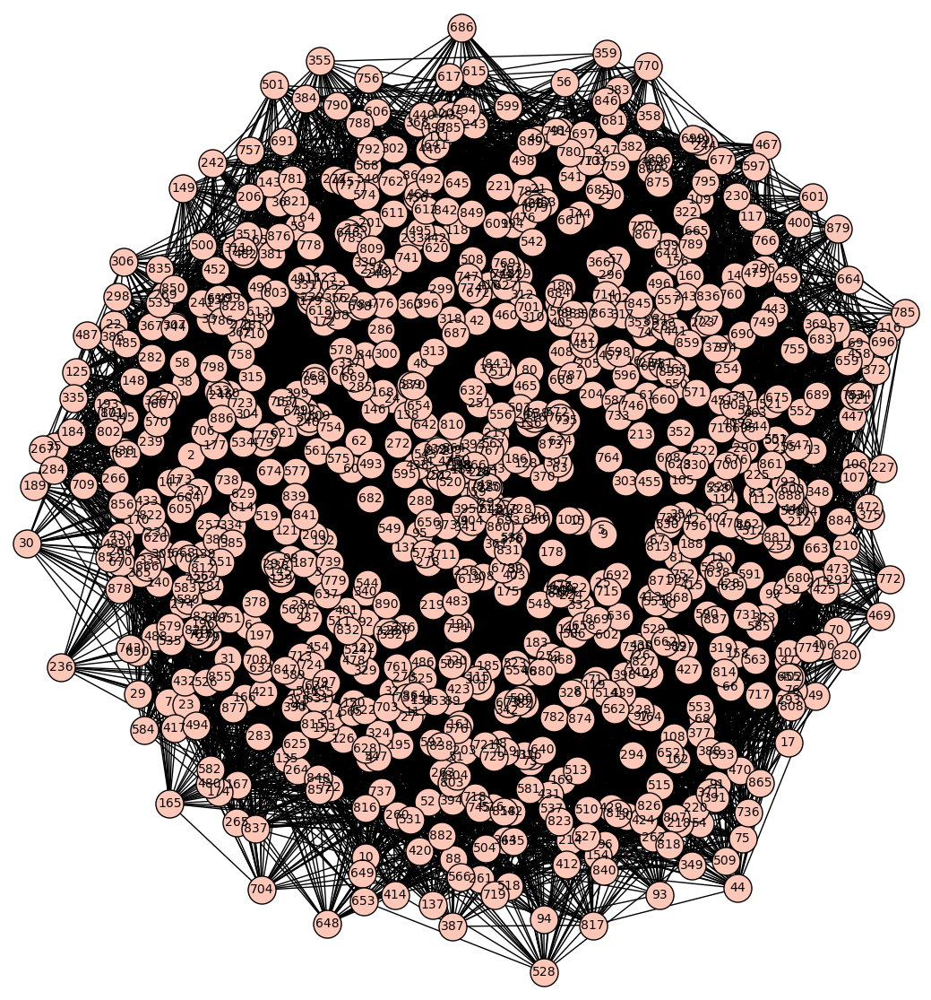

{30: 1, 3: 110, 12: 132, -3: 648}
891 30
True
False
3849120


In [9]:
G = Graph(graphs.strongly_regular_graph(243,22,1,2).adjacency_matrix())
H = tri_construct(G)
print("Strongly Regular Graph")
G.show(figsize=15, vertex_size=500)
print(e_val(G))
print("Computed Triangle Graph")
H.show(figsize=15, vertex_size=500)
print(e_val(H))
print(len(H.vertices()), H.average_degree())
print(H.is_regular())
print(H.is_strongly_regular())
print(H.automorphism_group().cardinality())

Strongly Regular Graph


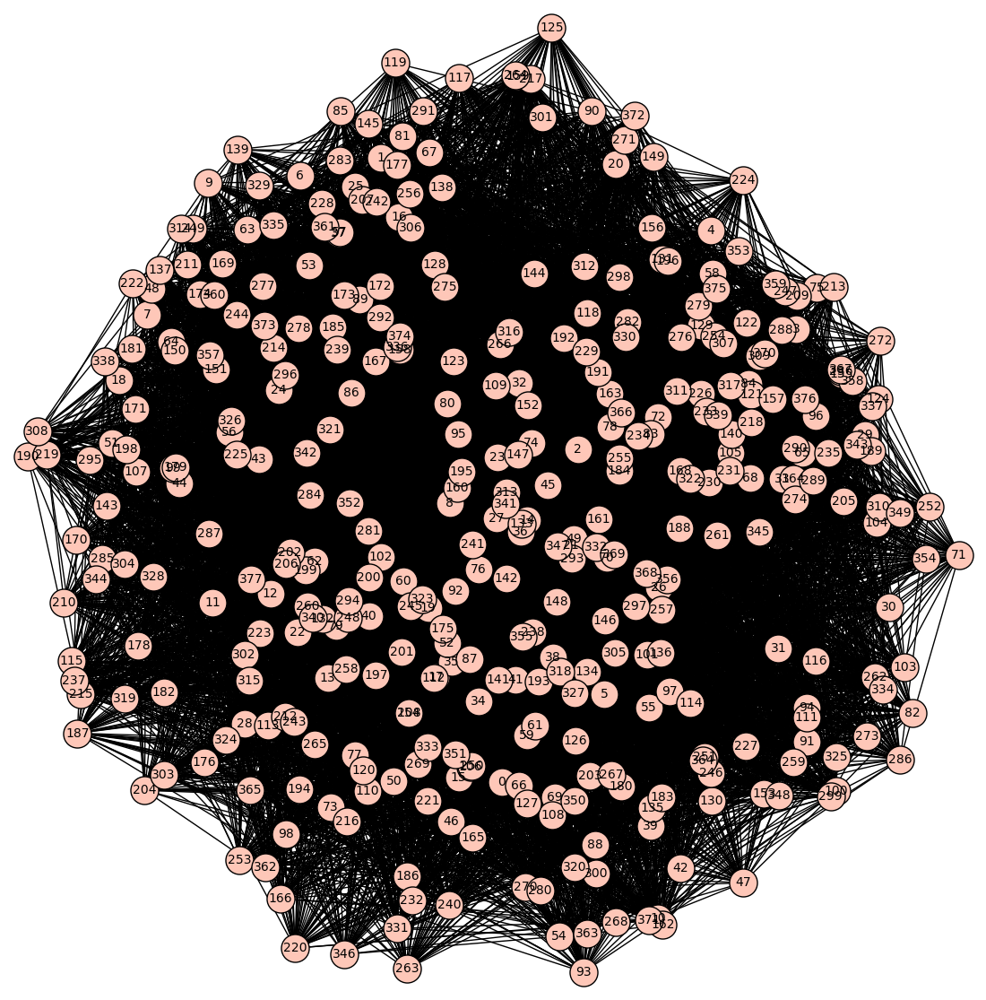

{52: 1, -11: 104, 4: 273}
Computed Triangle Graph


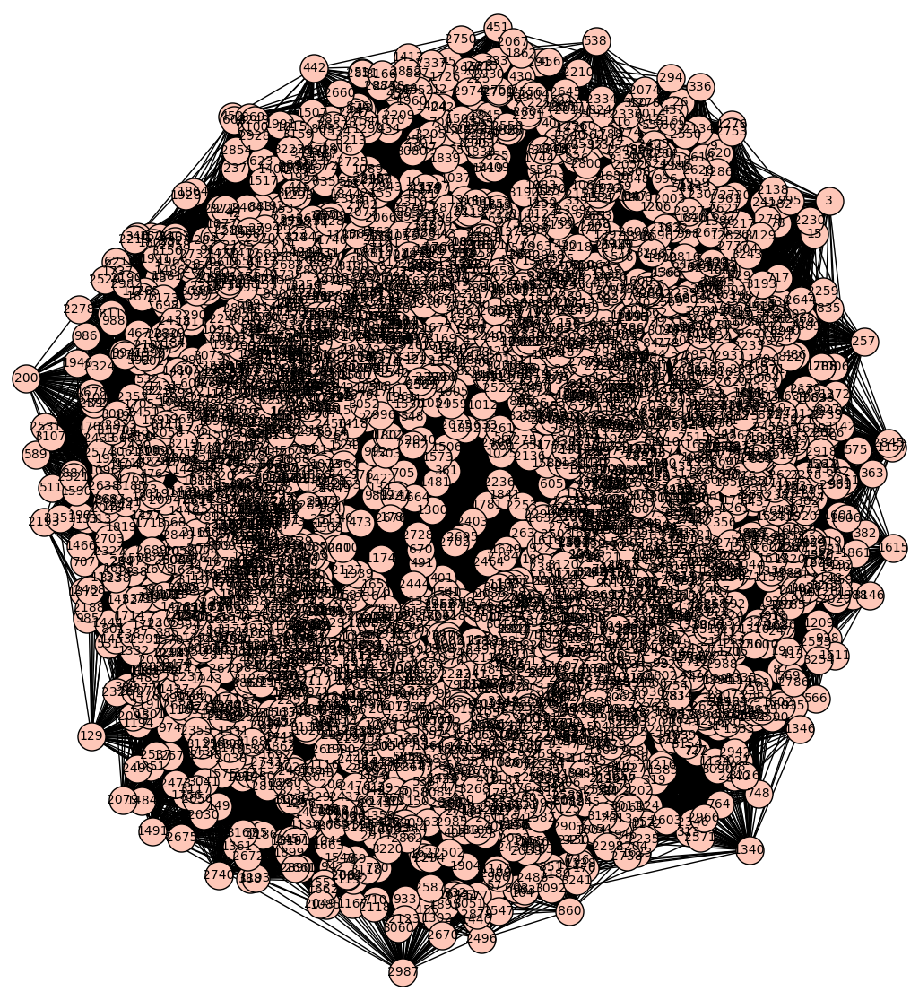

3276 75
True
False
15600


In [18]:
G = Graph(graphs.strongly_regular_graph(378,52,1,8).adjacency_matrix())
H = tri_construct(G)
print("Strongly Regular Graph")
G.show(figsize=15, vertex_size=500)
print(e_val(G))
print("Computed Triangle Graph")
H.show(figsize=15, vertex_size=500)
print(len(H.vertices()), H.average_degree())
print(H.is_regular())
print(H.is_strongly_regular())
print(H.automorphism_group().cardinality())

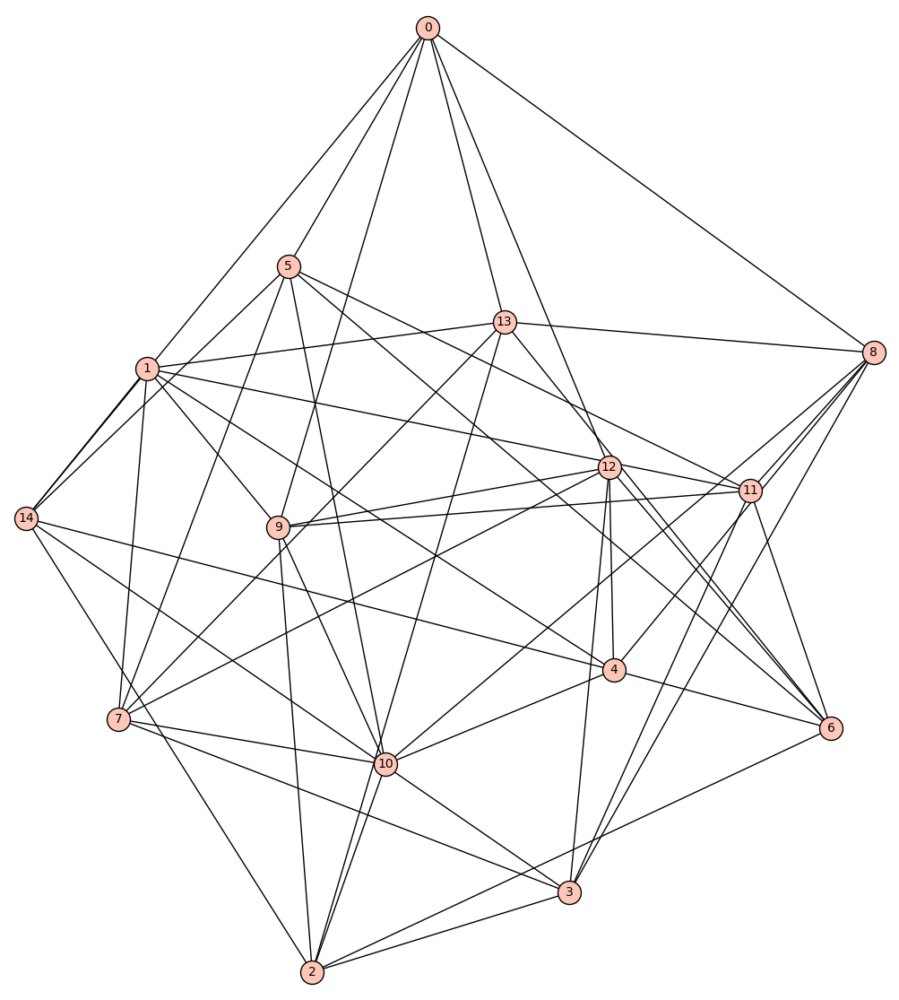

In [16]:
G = Graph(graphs.strongly_regular_graph(15,6,1,3).adjacency_matrix())
G.show(figsize=15, vertex_size=350)

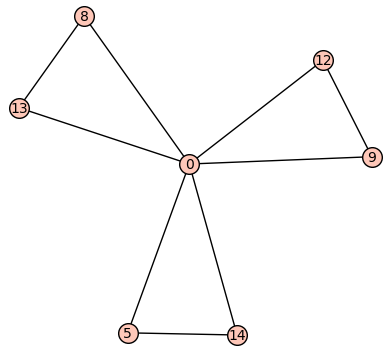

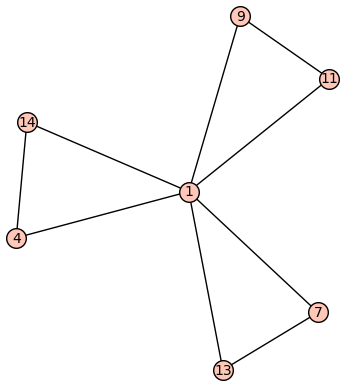

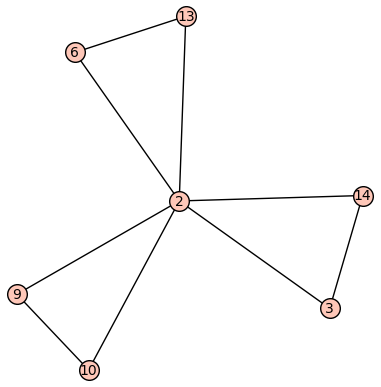

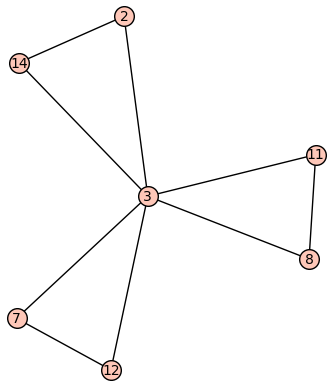

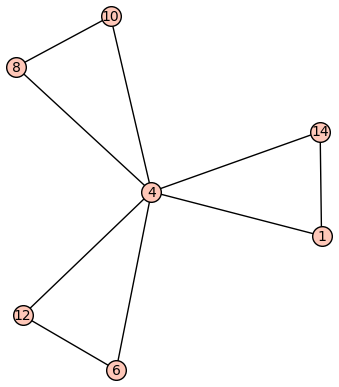

...

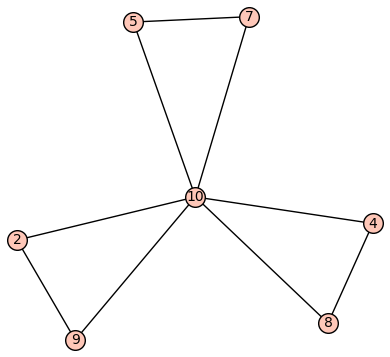

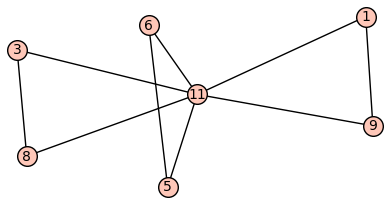

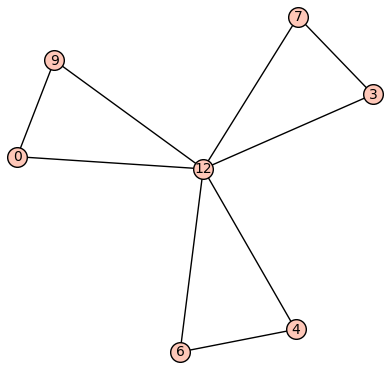

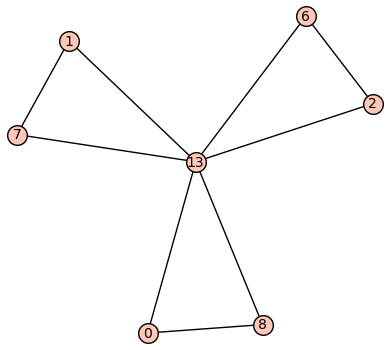

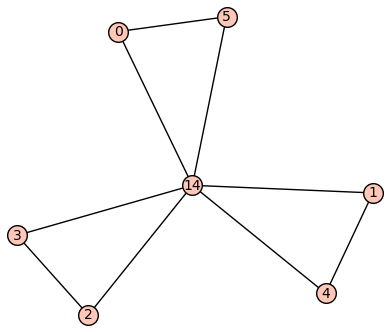

In [17]:
for vertex in G.vertices():
    K = graphs.EmptyGraph()
    for u in G.neighbors(vertex):
        K.add_edge(vertex, u)
    for u in G.neighbors(vertex):
        for v in G.neighbors(u):
            if v in G.neighbors(vertex):
                K.add_edge(v, u)
    K.show()